# **Proyek Klasifikasi Gambar: [Rice Image Dataset](https://www.kaggle.com/datasets/muratkokludataset/rice-image-dataset)**
- **Nama:** Masdarul Rizqi
- **Email:** m.rizqi1221@gmail.com
- **ID Dicoding:** masdarulrizqi

## **Import Semua Packages/Library yang Digunakan**

In [1]:
# Import libraries for image processing and handling
from PIL import Image
import os, random, zipfile, shutil , pathlib,  cv2, splitfolders
from pathlib import Path

# Import TensorFlow and Keras components
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import Callback, EarlyStopping

# Import libraries for visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Import libraries for numerical and machine learning tasks
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

## **Data Preparation**


### **Data Loading**

In [ ]:
os.environ['KAGGLE_CONFIG_DIR'] = ''

In [ ]:
!kaggle datasets list -s "Rice Image"

ref                                                 title                                          size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------  --------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
muratkokludataset/rice-image-dataset                Rice Image Dataset                            219MB  2022-04-03 02:12:00          26961       1882  0.875            
minhhuy2810/rice-diseases-image-dataset             Rice Diseases Image Dataset                    12GB  2019-11-15 22:17:33          15079        226  0.375            
muratkokludataset/rice-msc-dataset                  Rice MSC Dataset                              102MB  2022-04-03 01:33:52           1930       1457  0.9375           
mbsoroush/rice-images-dataset                       Rice Images Dataset                           220MB  2024-11-11 04:33:12            800         31

In [ ]:
!kaggle datasets download muratkokludataset/rice-image-dataset


  0%|          | 0.00/219M [00:00<?, ?B/s]
  0%|          | 1.00M/219M [00:02<09:21, 408kB/s]
  1%|          | 2.00M/219M [00:05<09:08, 415kB/s]
  1%|▏         | 3.00M/219M [00:07<09:39, 391kB/s]
  2%|▏         | 4.00M/219M [00:11<10:55, 345kB/s]
  2%|▏         | 5.00M/219M [00:13<10:02, 373kB/s]
  3%|▎         | 6.00M/219M [00:15<08:04, 462kB/s]
  3%|▎         | 7.00M/219M [00:16<06:50, 543kB/s]
  4%|▎         | 8.00M/219M [00:17<06:01, 614kB/s]
  4%|▍         | 9.00M/219M [00:18<05:29, 671kB/s]
  5%|▍         | 10.0M/219M [00:20<05:21, 683kB/s]
  5%|▌         | 11.0M/219M [00:21<05:01, 726kB/s]
  5%|▌         | 12.0M/219M [00:22<04:45, 760kB/s]
  6%|▌         | 13.0M/219M [00:24<04:36, 784kB/s]
  6%|▋         | 14.0M/219M [00:25<04:36, 778kB/s]
  7%|▋         | 15.0M/219M [00:26<04:23, 815kB/s]
  7%|▋         | 16.0M/219M [00:27<04:18, 824kB/s]
  8%|▊         | 17.0M/219M [00:29<04:15, 832kB/s]
  8%|▊         | 18.0M/219M [00:30<04:12, 836kB/s]
  9%|▊         | 19.0M/219M [00:31<04:

In [ ]:
local_zip = 'rice-image-dataset.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('')
zip_ref.close()

In [ ]:
# Folder input dan output
input_folder = "Rice"  # Path ke folder utama
output_folder = "Rice_IMG"  # Path ke folder tujuan

# Membuat folder output jika belum ada
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Variabel untuk menyimpan resolusi sebelumnya
previous_resolutions = []

# Fungsi untuk menghasilkan resolusi acak yang berbeda
def generate_random_resolution(min_size=100, max_size=500):
    while True:
        width = random.randint(min_size, max_size)
        height = random.randint(min_size, max_size)
        resolution = (width, height)
        if resolution not in previous_resolutions:
            previous_resolutions.append(resolution)
            return resolution

# Iterasi melalui semua subfolder dan file dalam folder input
for root, _, files in os.walk(input_folder):
    for file_name in files:
        if file_name.endswith(('.png', '.jpg', '.jpeg')):
            # Path lengkap file input
            file_path = os.path.join(root, file_name)

            # Membaca gambar
            image = cv2.imread(file_path)
            if image is None:
                print(f"Error membaca gambar: {file_name}")
                continue

            # Menghasilkan resolusi baru yang acak
            new_resolution = generate_random_resolution()

            # Resize gambar
            resized_image = cv2.resize(image, new_resolution)

            # Path lengkap untuk file output
            relative_path = os.path.relpath(root, input_folder)
            output_subfolder = os.path.join(output_folder, relative_path)

            # Membuat subfolder output jika belum ada
            if not os.path.exists(output_subfolder):
                os.makedirs(output_subfolder)

            output_path = os.path.join(output_subfolder, file_name)

            # Simpan gambar hasil
            cv2.imwrite(output_path, resized_image)
            print(f"Gambar {file_name} diubah ke resolusi {new_resolution} dan disimpan di {output_path}")

print("Proses selesai!")

Gambar Arborio (1).jpg diubah ke resolusi (384, 295) dan disimpan di Rice_IMG\Arborio\Arborio (1).jpg
Gambar Arborio (10).jpg diubah ke resolusi (190, 319) dan disimpan di Rice_IMG\Arborio\Arborio (10).jpg
Gambar Arborio (100).jpg diubah ke resolusi (347, 419) dan disimpan di Rice_IMG\Arborio\Arborio (100).jpg
Gambar Arborio (1000).jpg diubah ke resolusi (330, 424) dan disimpan di Rice_IMG\Arborio\Arborio (1000).jpg
Gambar Arborio (10000).jpg diubah ke resolusi (284, 443) dan disimpan di Rice_IMG\Arborio\Arborio (10000).jpg
Gambar Arborio (10001).jpg diubah ke resolusi (129, 278) dan disimpan di Rice_IMG\Arborio\Arborio (10001).jpg
Gambar Arborio (10002).jpg diubah ke resolusi (177, 225) dan disimpan di Rice_IMG\Arborio\Arborio (10002).jpg
Gambar Arborio (10003).jpg diubah ke resolusi (401, 245) dan disimpan di Rice_IMG\Arborio\Arborio (10003).jpg
Gambar Arborio (10004).jpg diubah ke resolusi (192, 124) dan disimpan di Rice_IMG\Arborio\Arborio (10004).jpg
Gambar Arborio (10005).jpg diu

In [ ]:
dataset_folder = "Rice_IMG"
def images_resolution(directory):
    unique_sizes = set()
    total_images = 0

    for subdir in os.listdir(directory):
        subdir_folder = os.path.join(directory, subdir)
        image_files = os.listdir(subdir_folder)
        num_images = len(image_files)
        print(f"{subdir}: {num_images}")
        total_images += num_images

        for img_file in image_files:
            img_path = os.path.join(subdir_folder, img_file)
            with Image.open(img_path) as img:
                unique_sizes.add(img.size)

        for size in unique_sizes:
            print(f"- {size}")
        print("---------------")

    print(f"\nTotal: {total_images}")

In [ ]:
images_resolution(dataset_folder)

Arborio: 15000
- (211, 332)
- (118, 104)
- (385, 219)
- (238, 435)
- (457, 312)
- (197, 168)
- (269, 273)
- (169, 335)
- (458, 209)
- (439, 196)
- (141, 273)
- (480, 493)
- (185, 279)
- (331, 104)
- (275, 209)
- (335, 223)
- (192, 440)
- (500, 327)
- (412, 214)
- (398, 279)
- (458, 330)
- (236, 217)
- (444, 166)
- (342, 155)
- (328, 220)
- (359, 324)
- (185, 171)
- (317, 327)
- (243, 112)
- (248, 227)
- (132, 281)
- (247, 268)
- (206, 230)
- (266, 281)
- (150, 335)
- (439, 209)
- (296, 389)
- (309, 328)
- (483, 215)
- (328, 341)
- (342, 276)
- (386, 282)
- (224, 220)
- (124, 282)
- (418, 271)
- (270, 107)
- (416, 161)
- (495, 454)
- (476, 212)
- (247, 389)
- (187, 109)
- (481, 290)
- (118, 238)
- (453, 228)
- (236, 459)
- (444, 408)
- (263, 333)
- (483, 336)
- (287, 461)
- (304, 105)
- (488, 451)
- (139, 297)
- (328, 233)
- (106, 120)
- (194, 233)
- (345, 402)
- (207, 172)
- (446, 454)
- (441, 110)
- (229, 456)
- (432, 290)
- (449, 459)
- (485, 153)
- (330, 279)
- (490, 231)
- (335, 35

### **Data Preprocessing**

#### **Split Dataset**

In [ ]:
# Path dataset asal dan tujuan
input_folder = "Rice_IMG"  # Path folder dataset asli
output_folder = "Data"  # Path folder output setelah split

# Membagi dataset 80% train, 20% test
splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.8, 0.2))


Copying files: 75000 files [11:09, 112.05 files/s]


## **Modelling**

In [4]:
train_folder = "Data/train"
val_folder = "Data/val"
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range = 20,
    horizontal_flip = True,
    shear_range = 0.2,
    fill_mode = 'nearest',
    validation_split = 0.2
)

val_datagen = ImageDataGenerator(
    rescale=1.0/255,
    validation_split = 0.2
)

train_generator = train_datagen.flow_from_directory(
    train_folder,
    target_size = (150, 150),
    batch_size = 64,
    class_mode = 'categorical',
)

val_generator = val_datagen.flow_from_directory(
    val_folder,
    target_size = (150, 150),
    batch_size = 64,
    class_mode = 'categorical',
)

Found 60000 images belonging to 5 classes.
Found 15000 images belonging to 5 classes.


In [5]:
model = models.Sequential([
    layers.Conv2D(16, (3, 3), padding = 'Same', activation='relu', input_shape=(150, 150, 3)),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(32, (3, 3), padding = 'Same', activation='relu'),
    layers.MaxPooling2D(2, 2),

    layers.Conv2D(64, (3, 3), padding = 'Same', activation='relu'),
    layers.MaxPooling2D(2, 2),

    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(5, activation='softmax')  #  kelas
])

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Menampilkan arsitektur model
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 150, 150, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 75, 75, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 75, 75, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 37, 37, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 37, 37, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 18, 18, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 20736)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │       1,327,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,351,077 (5.15 MB)

 Trainable params: 1,351,077 (5.15 MB)

 Non-trainable params: 0 (0.00 B)

In [6]:
class MyCallback(Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy') >= 0.96 and logs.get('val_accuracy') >= 0.96):
      print("\nAccuracy and Validation Accuracy has reached 96%!\nStop Train!")
      self.model.stop_training = True
Target = MyCallback()

EarlyStop = EarlyStopping(
    monitor = 'val_loss',
    min_delta = 0.0001,
    patience = 5,
    verbose = 1,
    mode = 'auto'
)

In [7]:
History = model.fit(
    train_generator,
    epochs =  30,
    validation_data = val_generator,
    callbacks = [Target, EarlyStop],
    verbose = 1
)

Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


938/938 ━━━━━━━━━━━━━━━━━━━━ 417s 435ms/step - accuracy: 0.9089 - loss: 0.2520 - val_accuracy: 0.9705 - val_loss: 0.0878
Epoch 2/30
937/938 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step - accuracy: 0.9738 - loss: 0.0787
Accuracy and Validation Accuracy has reached 96%!
Stop Train!
938/938 ━━━━━━━━━━━━━━━━━━━━ 398s 422ms/step - accuracy: 0.9738 - loss: 0.0787 - val_accuracy: 0.9907 - val_loss: 0.0271


## **Evaluasi dan Visualisasi**

Loss with Val_Loss Graph


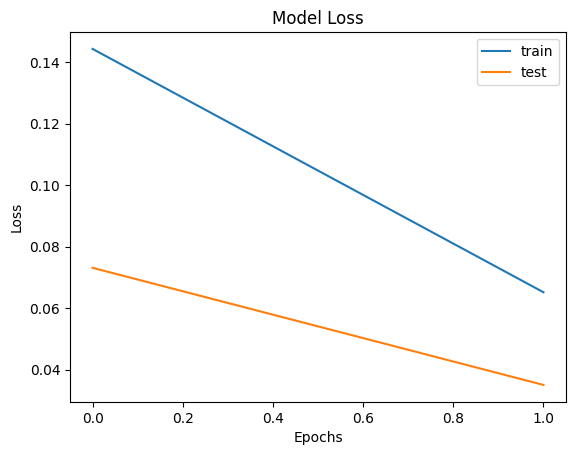

Acc with Val_Acc Graph


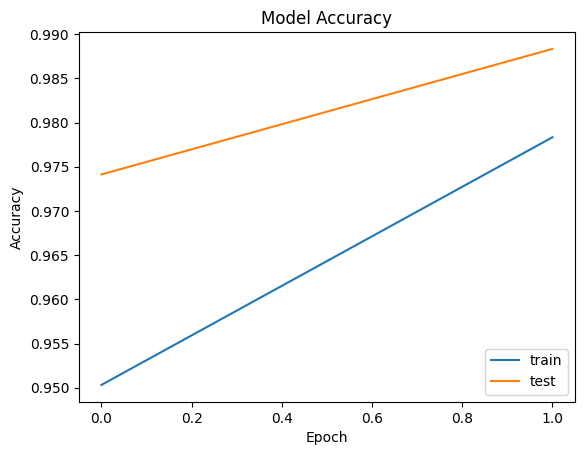

In [ ]:
print("Loss with Val_Loss Graph")
plt.plot(History.history['loss'])
plt.plot(History.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'], loc = 'upper right')
plt.show()

print("Acc with Val_Acc Graph")
plt.plot(History.history['accuracy'])
plt.plot(History.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

## **Konversi Model**

**TFLite**

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TensorFlow Lite model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

Saved artifact at '/tmp/tmph4pk9b2e'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  133790141432080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141433808: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141433616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141433424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141433232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141434192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141434576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141434960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141435728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133790141436880: TensorSpec(shape=(), dtype=tf.resource, name=None)


**Saved Model**

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model("/content/saved_model")
tflite_model = converter.convert()


tflite_model_file = pathlib.Path('model.tflite')
tflite_model_file.write_bytes(tflite_model)

**TFJs**

In [ ]:
import tensorflowjs as tfjs

# Convert the Keras model to TensorFlow.js format
tfjs.converters.save_keras_model(model, 'tfjs_model')

failed to lookup keras version from the file,
    this is likely a weight only file


## **Inference (Optional)**

In [ ]:
def images_preprocessing(filename):

    image = tf.io.decode_image(open(filename, 'rb').read(), channels=3)
    image = tf.image.resize(image, [150, 150])
    image = image/255.

    image_tensor = tf.expand_dims(image, 0)
    image_tensor = image_tensor.numpy().tolist()

    return image_tensor

In [ ]:
# Load the TFLite model
interpreter = tf.lite.Interpreter(model_path='model.tflite')
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Define a function for image preprocessing (same as in the training code)
def images_preprocessing(filename):
    image = tf.io.decode_image(open(filename, 'rb').read(), channels=3)
    image = tf.image.resize(image, [150, 150])
    image = image / 255.
    image_tensor = tf.expand_dims(image, 0)
    image_tensor = image_tensor.numpy()  # Use .numpy() here
    return image_tensor

# Example usage:
image_path = '/content/Data/train/Jasmine/Jasmine (1).jpg'  # Replace with the actual path to your image
input_data = images_preprocessing(image_path)

# Set the tensor
interpreter.set_tensor(input_details[0]['index'], input_data)

# Run inference
interpreter.invoke()

# Get the output
output_data = interpreter.get_tensor(output_details[0]['index'])

# Print the output (probabilities for each class)
print(output_data)

# Get the predicted class
predicted_class = tf.argmax(output_data[0]).numpy()
print(f"Predicted class: {predicted_class}")

# Class names (replace with your actual class names)
class_names = ['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']

# Print the predicted class name
print(f"Predicted class name: {class_names[predicted_class]}")

[[1.8293997e-04 3.2646942e-03 6.9580119e-06 9.9654537e-01 3.9749860e-08]]
Predicted class: 3
Predicted class name: Jasmine
